<a href="https://colab.research.google.com/github/rishuptdr/global-/blob/main/Global_Terrorism_Analysis_1_Capstone_Project.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## <b> The Global Terrorism Database (GTD) is an open-source database including information on terrorist attacks around the world from 1970 through 2017. The GTD includes systematic data on domestic as well as international terrorist incidents that have occurred during this time period and now includes more than 180,000 attacks. The database is maintained by researchers at the National Consortium for the Study of Terrorism and Responses to Terrorism (START), headquartered at the University of Maryland.</b>

# <b> Explore and analyze the data to discover key findings pertaining to terrorist activities. </b>

In [ ]:
#Importing Libraries
import pandas as pd
import numpy as np
import ast
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline


In [ ]:
#some more 

import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import norm
from sklearn.preprocessing import StandardScaler
from scipy import stats
import warnings
warnings.filterwarnings('ignore')
import plotly.express as px
from scipy.interpolate import interp1d

In [ ]:
!pip install geopandas

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 1.0 MB 5.2 MB/s 
     |████████████████████████████████| 16.7 MB 51.5 MB/s 
     |████████████████████████████████| 6.3 MB 43.2 MB/s 


In [ ]:
# import relevant packages
import geopandas as gpd
import pandas as pd
import matplotlib.pyplot as plt

In [ ]:
from google.colab import drive

In [ ]:
drive.mount('/content/drive')
file_path= "/content/drive/MyDrive/project/Copy of Global Terrorism Data.csv"

Mounted at /content/drive


In [ ]:
data= pd.read_csv(file_path,encoding='latin-1')

In [ ]:
data


,eventid,iyear,imonth,iday,approxdate,extended,resolution,country,country_txt,region,...,addnotes,scite1,scite2,scite3,dbsource,INT_LOG,INT_IDEO,INT_MISC,INT_ANY,related
0,197000000001,1970,7,2,NaN,0,NaN,58,Dominican Republic,2,...,NaN,NaN,NaN,NaN,PGIS,0,0,0,0,NaN
1,197000000002,1970,0,0,NaN,0,NaN,130,Mexico,1,...,NaN,NaN,NaN,NaN,PGIS,0,1,1,1,NaN
2,197001000001,1970,1,0,NaN,0,NaN,160,Philippines,5,...,NaN,NaN,NaN,NaN,PGIS,-9,-9,1,1,NaN
3,197001000002,1970,1,0,NaN,0,NaN,78,Greece,8,...,NaN,NaN,NaN,NaN,PGIS,-9,-9,1,1,NaN
4,197001000003,1970,1,0,NaN,0,NaN,101,Japan,4,...,NaN,NaN,NaN,NaN,PGIS,-9,-9,1,1,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
181686,201712310022,2017,12,31,NaN,0,NaN,182,Somalia,11,...,NaN,"""Somalia: Al-Shabaab Militants Attack Army Che...","""Highlights: Somalia Daily Media Highlights 2 ...","""Highlights: Somalia Daily Media Highlights 1 ...",START Primary Collection,0,0,0,0,NaN
181687,201712310029,2017,12,31,NaN,0,NaN,200,Syria,10,...,NaN,"""Putin's 'victory' in Syria has turned into a ...","""Two Russian soldiers killed at Hmeymim base i...","""Two Russian servicemen killed in Syria mortar...",START Primary Collection,-9,-9,1,1,NaN
181688,201712310030,2017,12,31,NaN,0,NaN,160,Philippines,5,...,NaN,"""Maguindanao clashes trap tribe members,"" Phil...",NaN,NaN,START Primary Collection,0,0,0,0,NaN
181689,201712310031,2017,12,31,NaN,0,NaN,92,India,6,...,NaN,"""Trader escapes grenade attack in Imphal,"" Bus...",NaN,NaN,START Primary Collection,-9,-9,0,-9,NaN


In [ ]:
data.isnull().sum()

eventid            0
iyear              0
imonth             0
iday               0
approxdate    172452
               ...  
INT_LOG            0
INT_IDEO           0
INT_MISC           0
INT_ANY            0
related       156653
Length: 135, dtype: int64

In [ ]:
map_and_stats=data.merge(data)
map_and_stats

,eventid,iyear,imonth,iday,approxdate,extended,resolution,country,country_txt,region,...,addnotes,scite1,scite2,scite3,dbsource,INT_LOG,INT_IDEO,INT_MISC,INT_ANY,related
0,197000000001,1970,7,2,NaN,0,NaN,58,Dominican Republic,2,...,NaN,NaN,NaN,NaN,PGIS,0,0,0,0,NaN
1,197000000002,1970,0,0,NaN,0,NaN,130,Mexico,1,...,NaN,NaN,NaN,NaN,PGIS,0,1,1,1,NaN
2,197001000001,1970,1,0,NaN,0,NaN,160,Philippines,5,...,NaN,NaN,NaN,NaN,PGIS,-9,-9,1,1,NaN
3,197001000002,1970,1,0,NaN,0,NaN,78,Greece,8,...,NaN,NaN,NaN,NaN,PGIS,-9,-9,1,1,NaN
4,197001000003,1970,1,0,NaN,0,NaN,101,Japan,4,...,NaN,NaN,NaN,NaN,PGIS,-9,-9,1,1,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
181686,201712310022,2017,12,31,NaN,0,NaN,182,Somalia,11,...,NaN,"""Somalia: Al-Shabaab Militants Attack Army Che...","""Highlights: Somalia Daily Media Highlights 2 ...","""Highlights: Somalia Daily Media Highlights 1 ...",START Primary Collection,0,0,0,0,NaN
181687,201712310029,2017,12,31,NaN,0,NaN,200,Syria,10,...,NaN,"""Putin's 'victory' in Syria has turned into a ...","""Two Russian soldiers killed at Hmeymim base i...","""Two Russian servicemen killed in Syria mortar...",START Primary Collection,-9,-9,1,1,NaN
181688,201712310030,2017,12,31,NaN,0,NaN,160,Philippines,5,...,NaN,"""Maguindanao clashes trap tribe members,"" Phil...",NaN,NaN,START Primary Collection,0,0,0,0,NaN
181689,201712310031,2017,12,31,NaN,0,NaN,92,India,6,...,NaN,"""Trader escapes grenade attack in Imphal,"" Bus...",NaN,NaN,START Primary Collection,-9,-9,0,-9,NaN


In [ ]:
data.describe()

,eventid,iyear,imonth,iday,extended,country,region,latitude,longitude,specificity,...,ransomamt,ransomamtus,ransompaid,ransompaidus,hostkidoutcome,nreleased,INT_LOG,INT_IDEO,INT_MISC,INT_ANY
count,1.816910e+05,181691.000000,181691.000000,181691.000000,181691.000000,181691.000000,181691.000000,177135.000000,1.771340e+05,181685.000000,...,1.350000e+03,5.630000e+02,7.740000e+02,552.000000,10991.000000,10400.000000,181691.000000,181691.000000,181691.000000,181691.000000
mean,2.002705e+11,2002.638997,6.467277,15.505644,0.045346,131.968501,7.160938,23.498343,-4.586957e+02,1.451452,...,3.172530e+06,5.784865e+05,7.179437e+05,240.378623,4.629242,-29.018269,-4.543731,-4.464398,0.090010,-3.945952
std,1.325957e+09,13.259430,3.388303,8.814045,0.208063,112.414535,2.933408,18.569242,2.047790e+05,0.995430,...,3.021157e+07,7.077924e+06,1.014392e+07,2940.967293,2.035360,65.720119,4.543547,4.637152,0.568457,4.691325
min,1.970000e+11,1970.000000,0.000000,0.000000,0.000000,4.000000,1.000000,-53.154613,-8.618590e+07,1.000000,...,-9.900000e+01,-9.900000e+01,-9.900000e+01,-99.000000,1.000000,-99.000000,-9.000000,-9.000000,-9.000000,-9.000000
25%,1.991021e+11,1991.000000,4.000000,8.000000,0.000000,78.000000,5.000000,11.510046,4.545640e+00,1.000000,...,0.000000e+00,0.000000e+00,-9.900000e+01,0.000000,2.000000,-99.000000,-9.000000,-9.000000,0.000000,-9.000000
50%,2.009022e+11,2009.000000,6.000000,15.000000,0.000000,98.000000,6.000000,31.467463,4.324651e+01,1.000000,...,1.500000e+04,0.000000e+00,0.000000e+00,0.000000,4.000000,0.000000,-9.000000,-9.000000,0.000000,0.000000
75%,2.014081e+11,2014.000000,9.000000,23.000000,0.000000,160.000000,10.000000,34.685087,6.871033e+01,1.000000,...,4.000000e+05,0.000000e+00,1.273412e+03,0.000000,7.000000,1.000000,0.000000,0.000000,0.000000,0.000000
max,2.017123e+11,2017.000000,12.000000,31.000000,1.000000,1004.000000,12.000000,74.633553,1.793667e+02,5.000000,...,1.000000e+09,1.320000e+08,2.750000e+08,48000.000000,7.000000,2769.000000,1.000000,1.000000,1.000000,1.000000


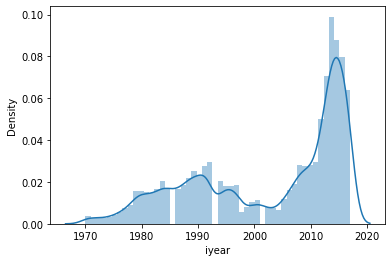

In [ ]:
#histogram
sns.distplot(data['iyear']);

In [ ]:
# Terror Attacks every year
yearsat=pd.DataFrame(data.iyear.value_counts().reset_index())
yearsat

,index,iyear
0,2014,16903
1,2015,14965
2,2016,13587
3,2013,12036
4,2017,10900
5,2012,8522
6,2011,5076
7,1992,5071
8,2010,4826
9,2008,4805


In [ ]:
data.replace(['NaN','Null',' ','//N'],np.nan,inplace= True)

In [ ]:
data = data.replace(0, np.nan)
data2 = data.dropna(subset=['iyear'])

In [ ]:
data2.describe(include= "all")

,eventid,iyear,imonth,iday,approxdate,extended,resolution,country,country_txt,region,...,scite1,scite2,scite3,dbsource,INT_LOG,INT_IDEO,INT_MISC,INT_ANY,related,number_at
count,1.816910e+05,181691.000000,181671.000000,180800.000000,9239,8239.0,2220,181691.000000,181691,181691.000000,...,115500,76933,43516,181691,99715.000000,115449.000000,21224.000000,121356.000000,25038,181691.0
unique,NaN,NaN,NaN,NaN,2244,NaN,1859,NaN,205,NaN,...,83988,62263,36090,26,NaN,NaN,NaN,NaN,14306,NaN
top,NaN,NaN,NaN,NaN,"September 18-24, 2016",NaN,8/4/1998,NaN,Iraq,NaN,...,Committee on Government Operations United Stat...,"Christopher Hewitt, ""Political Violence and Te...","Christopher Hewitt, ""Political Violence and Te...",START Primary Collection,NaN,NaN,NaN,NaN,"201612010023, 201612010024, 201612010025, 2016...",NaN
freq,NaN,NaN,NaN,NaN,101,NaN,18,NaN,24636,NaN,...,205,134,139,78002,NaN,NaN,NaN,NaN,80,NaN
mean,2.002705e+11,2002.638997,6.467989,15.582058,NaN,1.0,NaN,131.968501,NaN,7.160938,...,NaN,NaN,NaN,NaN,-8.279146,-7.025968,0.770543,-5.907775,NaN,1.0
std,1.325957e+09,13.259430,3.387810,8.768099,NaN,0.0,NaN,112.414535,NaN,2.933408,...,NaN,NaN,NaN,NaN,2.586306,3.980409,1.497340,4.621750,NaN,0.0
min,1.970000e+11,1970.000000,1.000000,1.000000,NaN,1.0,NaN,4.000000,NaN,1.000000,...,NaN,NaN,NaN,NaN,-9.000000,-9.000000,-9.000000,-9.000000,NaN,1.0
25%,1.991021e+11,1991.000000,4.000000,8.000000,NaN,1.0,NaN,78.000000,NaN,5.000000,...,NaN,NaN,NaN,NaN,-9.000000,-9.000000,1.000000,-9.000000,NaN,1.0
50%,2.009022e+11,2009.000000,6.000000,15.000000,NaN,1.0,NaN,98.000000,NaN,6.000000,...,NaN,NaN,NaN,NaN,-9.000000,-9.000000,1.000000,-9.000000,NaN,1.0
75%,2.014081e+11,2014.000000,9.000000,23.000000,NaN,1.0,NaN,160.000000,NaN,10.000000,...,NaN,NaN,NaN,NaN,-9.000000,-9.000000,1.000000,1.000000,NaN,1.0


# Top 10 country which is most affected 

In [ ]:
countryat= pd.DataFrame(data.country_txt.value_counts())
countryat

,country_txt
Iraq,24636
Pakistan,14368
Afghanistan,12731
India,11960
Colombia,8306
...,...
International,1
Wallis and Futuna,1
South Vietnam,1
Andorra,1


In [ ]:
countryat.head(10)

,country_txt
Iraq,24636
Pakistan,14368
Afghanistan,12731
India,11960
Colombia,8306
Philippines,6908
Peru,6096
El Salvador,5320
United Kingdom,5235
Turkey,4292


In [ ]:
data['number_at']= 1

In [ ]:
data

,eventid,iyear,imonth,iday,approxdate,extended,resolution,country,country_txt,region,...,scite1,scite2,scite3,dbsource,INT_LOG,INT_IDEO,INT_MISC,INT_ANY,related,number_at
0,197000000001,1970,7.0,2.0,NaN,NaN,NaN,58,Dominican Republic,2,...,NaN,NaN,NaN,PGIS,NaN,NaN,NaN,NaN,NaN,1
1,197000000002,1970,NaN,NaN,NaN,NaN,NaN,130,Mexico,1,...,NaN,NaN,NaN,PGIS,NaN,1.0,1.0,1.0,NaN,1
2,197001000001,1970,1.0,NaN,NaN,NaN,NaN,160,Philippines,5,...,NaN,NaN,NaN,PGIS,-9.0,-9.0,1.0,1.0,NaN,1
3,197001000002,1970,1.0,NaN,NaN,NaN,NaN,78,Greece,8,...,NaN,NaN,NaN,PGIS,-9.0,-9.0,1.0,1.0,NaN,1
4,197001000003,1970,1.0,NaN,NaN,NaN,NaN,101,Japan,4,...,NaN,NaN,NaN,PGIS,-9.0,-9.0,1.0,1.0,NaN,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
181686,201712310022,2017,12.0,31.0,NaN,NaN,NaN,182,Somalia,11,...,"""Somalia: Al-Shabaab Militants Attack Army Che...","""Highlights: Somalia Daily Media Highlights 2 ...","""Highlights: Somalia Daily Media Highlights 1 ...",START Primary Collection,NaN,NaN,NaN,NaN,NaN,1
181687,201712310029,2017,12.0,31.0,NaN,NaN,NaN,200,Syria,10,...,"""Putin's 'victory' in Syria has turned into a ...","""Two Russian soldiers killed at Hmeymim base i...","""Two Russian servicemen killed in Syria mortar...",START Primary Collection,-9.0,-9.0,1.0,1.0,NaN,1
181688,201712310030,2017,12.0,31.0,NaN,NaN,NaN,160,Philippines,5,...,"""Maguindanao clashes trap tribe members,"" Phil...",NaN,NaN,START Primary Collection,NaN,NaN,NaN,NaN,NaN,1
181689,201712310031,2017,12.0,31.0,NaN,NaN,NaN,92,India,6,...,"""Trader escapes grenade attack in Imphal,"" Bus...",NaN,NaN,START Primary Collection,-9.0,-9.0,NaN,-9.0,NaN,1


Text(0.5, 0, 'countries')

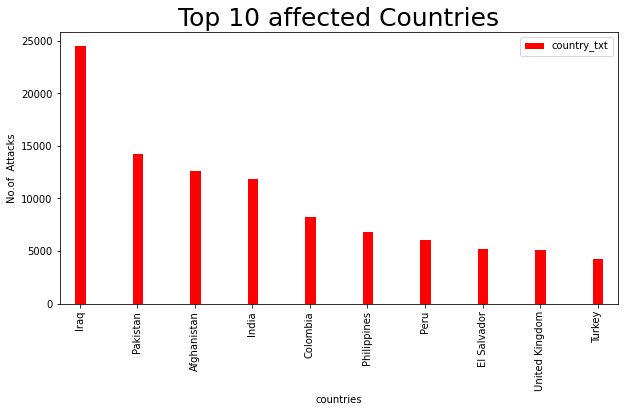

In [ ]:
countryat.head(10).plot.bar(width=0.2,figsize=(10,5),color='red',edgecolor='white',)
plt.title('Top 10 affected Countries',{'fontsize':25})
plt.ylabel('No.of  Attacks')
plt.xlabel('countries')

# work on heat map


In [ ]:
list1=data.number_at.values.tolist()


In [ ]:
list1



In [ ]:
### interpolating circle radious to given circle range 
m=interp1d([1,max(list1)],[5,16])


In [ ]:
type_ct=['open-stret-map','white-bg','carto-positron','carto-darkmatter','stamen-terrain','stamen-toner','stomen-watercolor']

In [ ]:
fig = px.scatter_mapbox(data,lat='latitude',lon='longitude', hover_name="city", color_discrete_sequence=["fuchsia"], zoom=0, height=300)
fig.update_layout(mapbox_style="open-street-map")
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()

In [ ]:


import plotly.express as px

fig = px.scatter_mapbox(data,lat='latitude',lon='longitude', hover_name="city", color_discrete_sequence=["fuchsia"], zoom=0, height=350)
fig.update_layout(
    mapbox_style="white-bg",
    mapbox_layers=[
        {
            "below": 'traces',
            "sourcetype": "raster",
            "sourceattribution": "United States Geological Survey",
            "source": [
                "https://basemap.nationalmap.gov/arcgis/rest/services/USGSImageryOnly/MapServer/tile/{z}/{y}/{x}"
            ]
        }
      ])
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()

In [ ]:
### interpolating circle radious to given circle range 
m=interp1d([1,max(list1)],[5,16])

In [ ]:
#plantting heatmaap on world map
type_ct=['open-stret-map','white-bg','carto-positron','carto-darkmatter','stamen-terrain','stamen-toner','stomen-watercolor']
for i in type_ct:
  print(i)
  fig=px.density_mapbox(data,lat='latitude',lon='longitude', hover_name="city", zoom=0, height=300)
  fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()

open-stret-map
white-bg
carto-positron
carto-darkmatter
stamen-terrain
stamen-toner
stomen-watercolor


In [ ]:
countryat.tail(10)


,country_txt
Vatican City,1
Falkland Islands,1
St. Lucia,1
North Korea,1
New Hebrides,1
International,1
Wallis and Futuna,1
South Vietnam,1
Andorra,1
Antigua and Barbuda,1


#Most affected cities


In [ ]:
city_at= pd.DataFrame(data.city.value_counts())

Text(0.5, 0, 'cities')

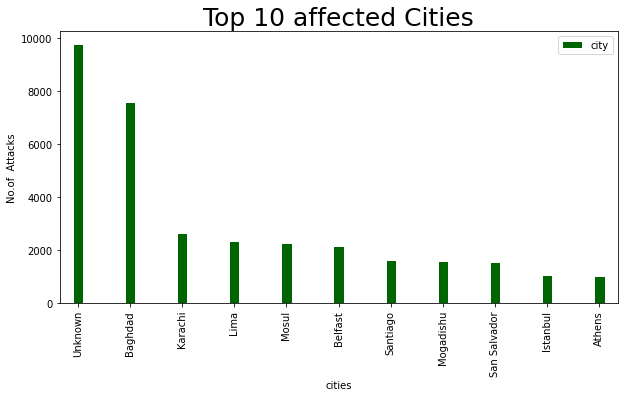

In [ ]:
city_at.head(11).plot.bar(width=0.2,figsize=(10,5),color='darkgreen',edgecolor='white',)
plt.title('Top 10 affected Cities',{'fontsize':25})
plt.ylabel('No.of  Attacks')
plt.xlabel('cities')


#Rigons affacted with terror

In [ ]:
region_at=pd.DataFrame(data.region_txt.value_counts())
region_at

,region_txt
Middle East & North Africa,50474
South Asia,44974
South America,18978
Sub-Saharan Africa,17550
Western Europe,16639
Southeast Asia,12485
Central America & Caribbean,10344
Eastern Europe,5144
North America,3456
East Asia,802


Text(0, 0.5, 'attacks')

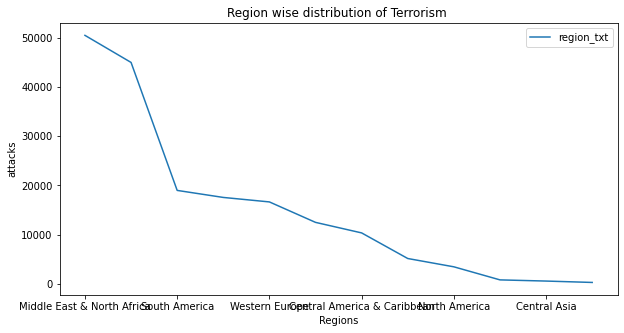

In [ ]:
region_at.plot.line(figsize=(10,5))
plt.title('Region wise distribution of Terrorism ')
plt.xlabel('Regions')
plt.ylabel('attacks')

#types of attack

In [ ]:

type_at=data.attacktype1_txt.value_counts()
type_at

Bombing/Explosion                      88255
Armed Assault                          42669
Assassination                          19312
Hostage Taking (Kidnapping)            11158
Facility/Infrastructure Attack         10356
Unknown                                 7276
Unarmed Assault                         1015
Hostage Taking (Barricade Incident)      991
Hijacking                                659
Name: attacktype1_txt, dtype: int64

Text(0.5, 0, 'types')

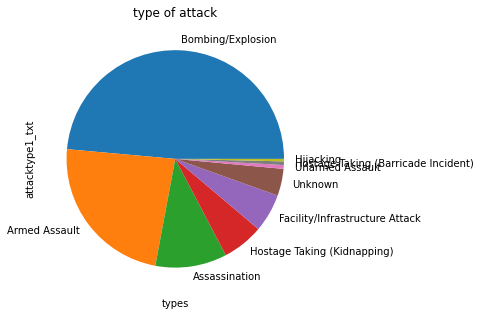

In [ ]:
type_at.plot.pie(figsize=(10,5))
plt.title('type of attack')
plt.xlabel('types')


###sRRR

In [ ]:

typelist= ['open-street-map','white-bg','carto-positron',]


In [ ]:
list1=data.attacktype1.values.tolist()
typelist= ['open-street-map','white-bg','carto-positron',]

for i in typelist:
  print(i)
  fig=px.density_mapbox(data,lat='latitude',lon='longitude',)
  fig.show

open-street-map
white-bg
carto-positron


##Weapons used in attack

In [ ]:
weap_at= data.weaptype1_txt.value_counts()
weap_at

Explosives                                                                     92426
Firearms                                                                       58524
Unknown                                                                        15157
Incendiary                                                                     11135
Melee                                                                           3655
Chemical                                                                         321
Sabotage Equipment                                                               141
Vehicle (not to include vehicle-borne explosives, i.e., car or truck bombs)      136
Other                                                                            114
Biological                                                                        35
Fake Weapons                                                                      33
Radiological                                                     

Text(0.5, 0, 'types')

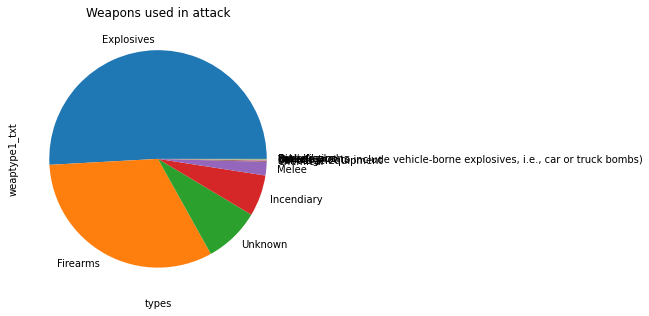

In [ ]:

a=weap_at.plot.pie(figsize=(10,5))
plt.title('Weapons used in attack')
plt.xlabel('types')


In [ ]:

data.groupby('country_txt')['city'].value_counts()

country_txt  city         
Afghanistan  Unknown          1124
             Kabul             738
             Kandahar          363
             Jalalabad         266
             Lashkar Gah       190
                              ... 
Zimbabwe     Sadza               1
             Shamva              1
             Somabhula           1
             Trenance            1
             Zaka District       1
Name: city, Length: 38120, dtype: int64

In [ ]:
countryat.head(10)

,country_txt
Iraq,24636
Pakistan,14368
Afghanistan,12731
India,11960
Colombia,8306
Philippines,6908
Peru,6096
El Salvador,5320
United Kingdom,5235
Turkey,4292


In [ ]:
data[data.country_txt=='Iraq'].city.value_counts().head(10).sort_index()

Abu Ghraib       324
Baghdad         7585
Baqubah          745
Fallujah         579
Kirkuk           925
Mosul           2265
Ramadi           509
Tikrit           418
Tuz Khormato     277
Unknown          562
Name: city, dtype: int64

Text(0, 0.5, 'No.of incidents')

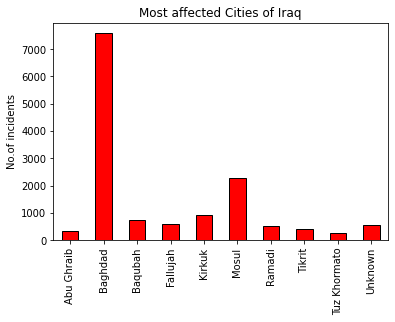

In [ ]:
data[data.country_txt=='Iraq'].city.value_counts().head(10).sort_index().plot.bar(color='red',edgecolor='black')
plt.title('Most affected Cities of Iraq')
plt.ylabel('No.of incidents')

Text(0, 0.5, 'No.of incidents')

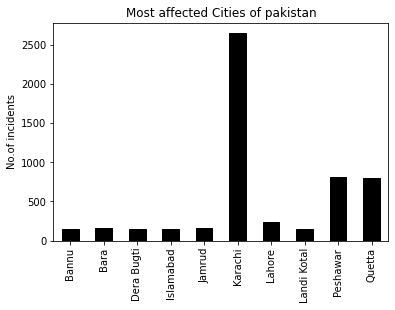

In [ ]:
data[data.country_txt=='Pakistan'].city.value_counts().head(10).sort_index().plot.bar(color='black',edgecolor='black')
plt.title('Most affected Cities of pakistan')
plt.ylabel('No.of incidents')

In [ ]:
data[data.country_txt=='Afghanistan'].city.value_counts().head(10).sort_index()

Ghazni              189
Herat               131
Jalalabad           266
Kabul               738
Kandahar            363
Khost               182
Kunduz              142
Lashkar Gah         190
Sangin district     117
Unknown            1124
Name: city, dtype: int64

Text(0, 0.5, 'No.of incidents')

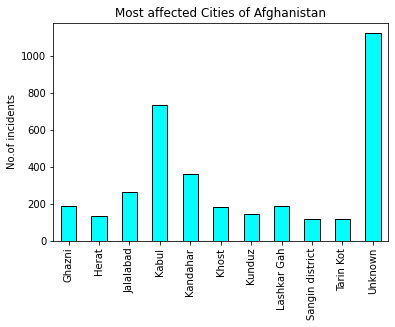

In [ ]:
data[data.country_txt=='Afghanistan'].city.value_counts().head(11).sort_index().plot.bar(color='cyan',edgecolor='black')
plt.title('Most affected Cities of Afghanistan')
plt.ylabel('No.of incidents')

In [ ]:
data[data.country_txt=='India'].city.value_counts().head(10).sort_index()

Amritsar     138
Anantnag      76
Guwahati      77
Imphal       426
Jammu         57
Ludhiana      77
New Delhi    157
Sopore       102
Srinagar     658
Unknown      624
Name: city, dtype: int64

Text(0, 0.5, 'No.of incidents')

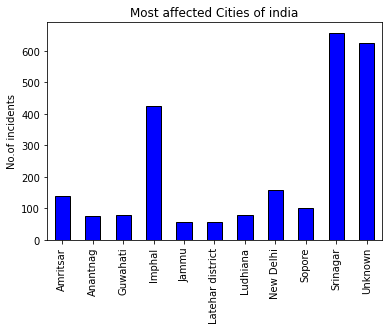

In [ ]:
data[data.country_txt=='India'].city.value_counts().head(11).sort_index().plot.bar(color='blue',edgecolor='black')
plt.title('Most affected Cities of india')
plt.ylabel('No.of incidents')

Text(0, 0.5, 'No.of incidents')

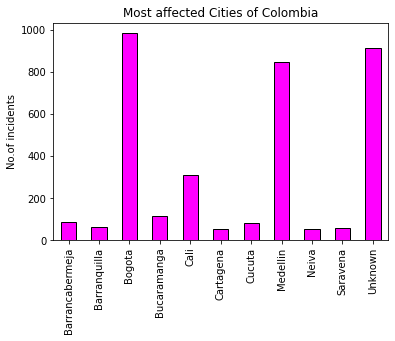

In [ ]:
data[data.country_txt=='Colombia'].city.value_counts().head(11).sort_index().plot.bar(color='magenta',edgecolor='black')
plt.title('Most affected Cities of Colombia')
plt.ylabel('No.of incidents')

Text(0, 0.5, 'No.of incidents')

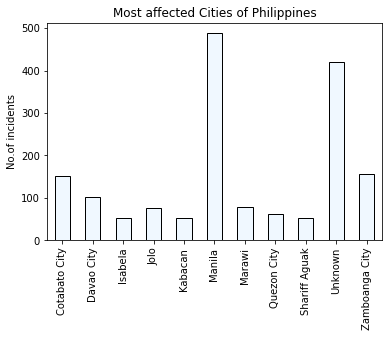

In [ ]:
data[data.country_txt=='Philippines'].city.value_counts().head(11).sort_index().plot.bar(color='aliceblue',edgecolor='black')
plt.title('Most affected Cities of Philippines')
plt.ylabel('No.of incidents')

Text(0, 0.5, 'No.of incidents')

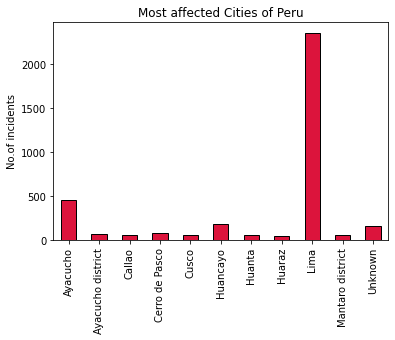

In [ ]:
data[data.country_txt=='Peru'].city.value_counts().head(11).sort_index().plot.bar(color='crimson',edgecolor='black')
plt.title('Most affected Cities of Peru')
plt.ylabel('No.of incidents')

Text(0, 0.5, 'No.of incidents')

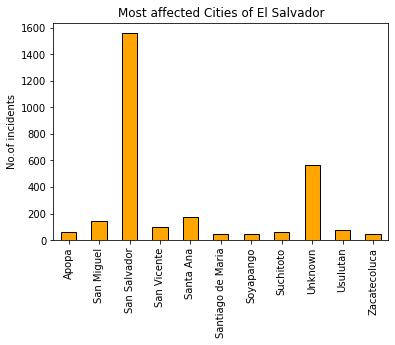

In [ ]:
data[data.country_txt=='El Salvador'].city.value_counts().head(11).sort_index().plot.bar(color='orange',edgecolor='black')
plt.title('Most affected Cities of El Salvador')
plt.ylabel('No.of incidents')

Text(0, 0.5, 'No.of incidents')

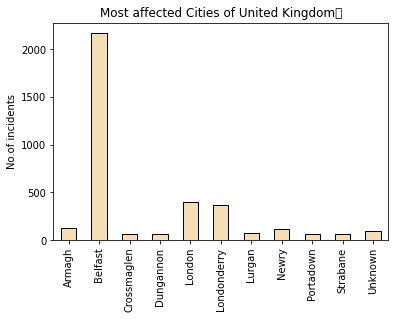

In [ ]:
data[data.country_txt=='United Kingdom'].city.value_counts().head(11).sort_index().plot.bar(color='wheat',edgecolor='black')
plt.title('Most affected Cities of United Kingdom	')
plt.ylabel('No.of incidents')

Text(0, 0.5, 'No.of incidents')

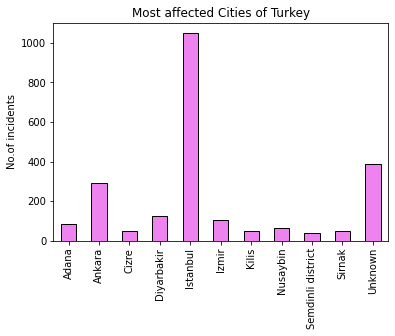

In [ ]:
data[data.country_txt=='Turkey'].city.value_counts().head(11).sort_index().plot.bar(color='violet',edgecolor='black')
plt.title('Most affected Cities of Turkey')
plt.ylabel('No.of incidents')

#Most Notorious Terror Organisations

Text(0, 0.5, 'No.of Terror attacks')

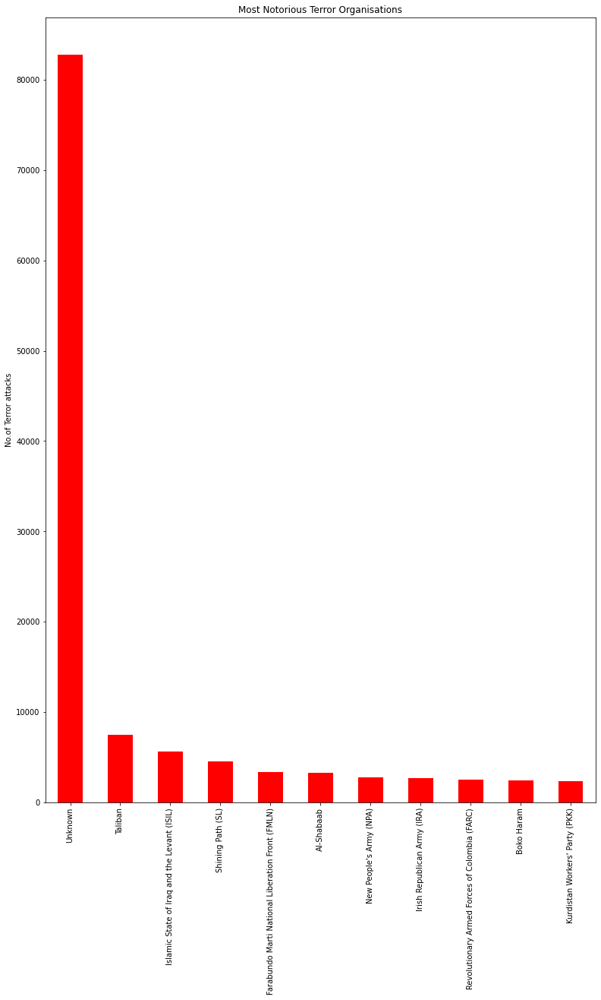

In [ ]:
data.gname.value_counts().head(11).plot.bar(color='red',figsize=(13,19))
plt.title('Most Notorious Terror Organisations')
plt.ylabel('No.of Terror attacks')

#other details of data

In [ ]:
data.shape 

(181691, 136)

In [ ]:
type(data)

pandas.core.frame.DataFrame

In [ ]:
data.to_csv('F:\project 1'+'output_data.csv')

In [ ]:
data.head()

,eventid,iyear,imonth,iday,approxdate,extended,resolution,country,country_txt,region,...,scite1,scite2,scite3,dbsource,INT_LOG,INT_IDEO,INT_MISC,INT_ANY,related,number_at
0,197000000001,1970,7.0,2.0,NaN,NaN,NaN,58,Dominican Republic,2,...,NaN,NaN,NaN,PGIS,NaN,NaN,NaN,NaN,NaN,1
1,197000000002,1970,NaN,NaN,NaN,NaN,NaN,130,Mexico,1,...,NaN,NaN,NaN,PGIS,NaN,1.0,1.0,1.0,NaN,1
2,197001000001,1970,1.0,NaN,NaN,NaN,NaN,160,Philippines,5,...,NaN,NaN,NaN,PGIS,-9.0,-9.0,1.0,1.0,NaN,1
3,197001000002,1970,1.0,NaN,NaN,NaN,NaN,78,Greece,8,...,NaN,NaN,NaN,PGIS,-9.0,-9.0,1.0,1.0,NaN,1
4,197001000003,1970,1.0,NaN,NaN,NaN,NaN,101,Japan,4,...,NaN,NaN,NaN,PGIS,-9.0,-9.0,1.0,1.0,NaN,1


In [ ]:
data.size

24709976

In [ ]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 181691 entries, 0 to 181690
Columns: 136 entries, eventid to number_at
dtypes: float64(70), int64(8), object(58)
memory usage: 188.5+ MB


In [ ]:
data.describe()

,eventid,iyear,imonth,iday,extended,country,region,latitude,longitude,specificity,...,ransomamtus,ransompaid,ransompaidus,hostkidoutcome,nreleased,INT_LOG,INT_IDEO,INT_MISC,INT_ANY,number_at
count,1.816910e+05,181691.000000,181671.000000,180800.000000,8239.0,181691.000000,181691.000000,177135.000000,1.771340e+05,181685.000000,...,5.100000e+01,5.290000e+02,30.000000,10991.000000,8086.000000,99715.000000,115449.000000,21224.000000,121356.000000,181691.0
mean,2.002705e+11,2002.638997,6.467989,15.582058,1.0,131.968501,7.160938,23.498343,-4.586957e+02,1.451452,...,6.386038e+06,1.050451e+06,4422.966667,4.629242,-37.322533,-8.279146,-7.025968,0.770543,-5.907775,1.0
std,1.325957e+09,13.259430,3.387810,8.768099,0.0,112.414535,2.933408,18.569242,2.047790e+05,0.995430,...,2.291858e+07,1.225952e+07,12049.859929,2.035360,72.424683,2.586306,3.980409,1.497340,4.621750,0.0
min,1.970000e+11,1970.000000,1.000000,1.000000,1.0,4.000000,1.000000,-53.154613,-8.618590e+07,1.000000,...,-9.900000e+01,-9.900000e+01,-99.000000,1.000000,-99.000000,-9.000000,-9.000000,-9.000000,-9.000000,1.0
25%,1.991021e+11,1991.000000,4.000000,8.000000,1.0,78.000000,5.000000,11.510046,4.545640e+00,1.000000,...,-9.900000e+01,-9.900000e+01,-99.000000,2.000000,-99.000000,-9.000000,-9.000000,1.000000,-9.000000,1.0
50%,2.009022e+11,2009.000000,6.000000,15.000000,1.0,98.000000,6.000000,31.467463,4.324651e+01,1.000000,...,1.500000e+04,-9.900000e+01,-99.000000,4.000000,1.000000,-9.000000,-9.000000,1.000000,-9.000000,1.0
75%,2.014081e+11,2014.000000,9.000000,23.000000,1.0,160.000000,10.000000,34.685087,6.871033e+01,1.000000,...,3.000000e+06,4.010000e+04,-99.000000,7.000000,2.000000,-9.000000,-9.000000,1.000000,1.000000,1.0
max,2.017123e+11,2017.000000,12.000000,31.000000,1.0,1004.000000,12.000000,74.633553,1.793667e+02,5.000000,...,1.320000e+08,2.750000e+08,48000.000000,7.000000,2769.000000,1.000000,1.000000,1.000000,1.000000,1.0


In [ ]:
data.iloc[:10,-100:]

,targsubtype1,targsubtype1_txt,corp1,target1,natlty1,natlty1_txt,targtype2,targtype2_txt,targsubtype2,targsubtype2_txt,...,scite1,scite2,scite3,dbsource,INT_LOG,INT_IDEO,INT_MISC,INT_ANY,related,number_at
0,68.0,Named Civilian,NaN,Julio Guzman,58.0,Dominican Republic,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,PGIS,NaN,NaN,NaN,NaN,NaN,1
1,45.0,"Diplomatic Personnel (outside of embassy, cons...",Belgian Ambassador Daughter,"Nadine Chaval, daughter",21.0,Belgium,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,PGIS,NaN,1.0,1.0,1.0,NaN,1
2,54.0,Radio Journalist/Staff/Facility,Voice of America,Employee,217.0,United States,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,PGIS,-9.0,-9.0,1.0,1.0,NaN,1
3,46.0,Embassy/Consulate,NaN,U.S. Embassy,217.0,United States,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,PGIS,-9.0,-9.0,1.0,1.0,NaN,1
4,46.0,Embassy/Consulate,NaN,U.S. Consulate,217.0,United States,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,PGIS,-9.0,-9.0,1.0,1.0,NaN,1
5,22.0,"Police Building (headquarters, station, school)",Cairo Police Department,Cairo Police Headquarters,217.0,United States,NaN,NaN,NaN,NaN,...,"""Police Chief Quits,"" Washington Post, January...","""Cairo Police Chief Quits; Decries Local 'Mili...","Christopher Hewitt, ""Political Violence and Te...",Hewitt Project,-9.0,-9.0,NaN,-9.0,NaN,1
6,25.0,Police Security Forces/Officers,Uruguayan Police,Juan Maria de Lucah/Chief of Directorate of in...,218.0,Uruguay,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,PGIS,NaN,NaN,NaN,NaN,NaN,1
7,107.0,Electricity,Pacific Gas & Electric Company,Edes Substation,217.0,United States,NaN,NaN,NaN,NaN,...,Committee on Government Operations United Stat...,"Christopher Hewitt, ""Political Violence and Te...",NaN,Hewitt Project,-9.0,-9.0,NaN,-9.0,NaN,1
8,28.0,Military Recruiting Station/Academy,R.O.T.C.,"R.O.T.C. offices at University of Wisconsin, M...",217.0,United States,NaN,NaN,NaN,NaN,...,"Tom Bates, ""Rads: The 1970 Bombing of the Army...","David Newman, Sandra Sutherland, and Jon Stewa...","The Wisconsin Cartographers' Guild, ""Wisconsin...",Hewitt Project,NaN,NaN,NaN,NaN,NaN,1
9,21.0,Government Building/Facility/Office,Selective Service,Selective Service Headquarters in Madison Wisc...,217.0,United States,NaN,NaN,NaN,NaN,...,Committee on Government Operations United Stat...,"Tom Bates, ""Rads: The 1970 Bombing of the Army...","David Newman, Sandra Sutherland, and Jon Stewa...",Hewitt Project,NaN,NaN,NaN,NaN,NaN,1


In [ ]:
data['year']==1970

0          True
1          True
2          True
3          True
4          True
          ...  
181686    False
181687    False
181688    False
181689    False
181690    False
Name: year, Length: 181691, dtype: bool

In [ ]:

year170=data[data['year']==2000]

year170

,eventid,year,imonth,iday,approxdate,extended,resolution,country,country_txt,region,...,addnotes,scite1,scite2,scite3,dbsource,INT_LOG,INT_IDEO,INT_MISC,INT_ANY,related
69835,200001010001,2000,1,1,NaN,0,NaN,139,Namibia,11,...,NaN,Namibia: UNITA Rebels Reportedly Abduct 20 Vi...,Namibia: 4 Injured in Shootout; UNITA 'Bandit...,Abducted Namibians Reportedly Still Held by U...,CETIS,1,1,0,1,"200001010001, 200001010002"
69836,200001010002,2000,1,1,NaN,1,NaN,139,Namibia,11,...,NaN,Namibia: UNITA Rebels Reportedly Abduct 20 Vi...,Namibia: 4 Injured in Shootout; UNITA 'Bandit...,Abducted Namibians Reportedly Still Held by U...,CETIS,1,1,0,1,"200001010002, 200001010001"
69837,200001010003,2000,1,1,NaN,0,NaN,92,India,6,...,NaN,Lashkar 'Suicide' Squad Attacks Army Camp in ...,NaN,NaN,CETIS,1,1,0,1,NaN
69838,200001010004,2000,1,1,NaN,0,NaN,1003,Kosovo,9,...,NaN,"Kosovo: Romany Home Attacked, 1 Person Injure...",NaN,NaN,CETIS,-9,-9,1,1,NaN
69839,200001010005,2000,1,1,NaN,0,NaN,182,Somalia,11,...,NaN,"Somalia: 'Over 6' Killed in Mogadishu Attack,...",NaN,NaN,CETIS,-9,-9,0,-9,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
71645,200012310008,2000,12,31,NaN,1,1/1/2001,1003,Kosovo,9,...,It is unclear what the abductors received in r...,"""Six Serbs kidnapped in Kosovo buffer zone rel...","Gillian Sandford, ""Nato intervenes to get Serb...","""Six Serb hostages released,"" Associated Press...",UMD Schmid 2012,1,1,1,1,NaN
71646,200012310009,2000,12,31,NaN,0,NaN,69,France,8,...,The same building was targeted three times bef...,"""Corsican government office damaged in blast,""...","""Corsica bomb blast damages government buildin...",NaN,UMD Schmid 2012,-9,-9,0,-9,NaN
71647,200012310011,2000,12,31,NaN,0,NaN,6,Algeria,10,...,NaN,"Riadh S., ""Two bomb blasts near Lakhdaria: Two...","""Latest attacks claim nine lives in violence-t...","""Three dead, two injured in fresh violence in ...",UMD Algeria 2010-2012,0,0,0,0,NaN
71648,200012310012,2000,12,31,NaN,0,NaN,141,Nepal,6,...,NaN,"Paul Harris, ""News - Communist strike paralyse...","""Nepal: Capital paralysed by anti-Indian prote...",NaN,UMD Schmid 2012,-9,-9,0,-9,"200012310012, 200012310013"


In [ ]:
year1=data[(data['year'])&(data['city']=='Delhi')]

year1

,eventid,year,imonth,iday,approxdate,extended,resolution,country,country_txt,region,...,addnotes,scite1,scite2,scite3,dbsource,INT_LOG,INT_IDEO,INT_MISC,INT_ANY,related
19979,198310130002,1983,10,13,NaN,0,NaN,92,India,6,...,NaN,NaN,NaN,NaN,PGIS,-9,-9,0,-9,"198310130002, 198310130003"
19980,198310130003,1983,10,13,NaN,0,NaN,92,India,6,...,NaN,NaN,NaN,NaN,PGIS,-9,-9,0,-9,"198310130002, 198310130003"
29926,198701120005,1987,1,12,NaN,0,NaN,92,India,6,...,NaN,NaN,NaN,NaN,PGIS,0,0,0,0,NaN
31700,198707290003,1987,7,29,NaN,0,NaN,92,India,6,...,NaN,NaN,NaN,NaN,PGIS,0,0,0,0,"198707290003, 198707290004"
31701,198707290004,1987,7,29,NaN,0,NaN,92,India,6,...,NaN,NaN,NaN,NaN,PGIS,0,0,0,0,"198707290004, 198707290003"
31705,198707290008,1987,7,29,NaN,0,NaN,92,India,6,...,NaN,NaN,NaN,NaN,PGIS,0,0,0,0,"198707290008, 198707290009"
31706,198707290009,1987,7,29,NaN,0,NaN,92,India,6,...,NaN,NaN,NaN,NaN,PGIS,0,0,0,0,"198707290009, 198707290008"
31713,198707300007,1987,7,30,NaN,0,NaN,92,India,6,...,NaN,NaN,NaN,NaN,PGIS,0,0,0,0,NaN
31718,198707300012,1987,7,30,NaN,0,NaN,92,India,6,...,NaN,NaN,NaN,NaN,PGIS,0,0,0,0,NaN
31719,198707300013,1987,7,30,NaN,0,NaN,92,India,6,...,NaN,NaN,NaN,NaN,PGIS,0,0,0,0,NaN


In [ ]:
gname1=data[data['gname']=='Boko Haram']
gname1

,eventid,year,imonth,iday,approxdate,extended,resolution,country,country_txt,region,...,addnotes,scite1,scite2,scite3,dbsource,INT_LOG,INT_IDEO,INT_MISC,INT_ANY,related
92956,200907270015,2009,7,27,NaN,0,NaN,147,Nigeria,11,...,NaN,"Ibrahim Mshelizza, ""Hundreds Of Bodies in Stre...","Press TV, ""Fierce Clashes Continue in Nigeria,...","Jane's Intelligence, ""Islamist Militants Attac...",ISVG,0,0,0,0,"200907270015, 200907270030, 200907270031"
92957,200907270016,2009,7,27,NaN,0,NaN,147,Nigeria,11,...,This was one of four related attacks (cf. 2009...,"Ibrahim Mshelizza, ""Hundreds Of Bodies in Stre...","Press TV, ""Fierce Clashes Continue in Nigeria,...","Jane's Intelligence, ""Islamist Militants Attac...",ISVG,0,0,0,0,"200907270016, 200907270027, 200907270028, 2009..."
92958,200907270017,2009,7,27,NaN,0,NaN,147,Nigeria,11,...,This was one of three related attacks (cf. 200...,"Ibrahim Mshelizza, ""Hundreds Of Bodies in Stre...","Press TV, ""Fierce Clashes Continue in Nigeria,...","Jane's Intelligence, ""Islamist Militants Attac...",ISVG,0,0,0,0,"200907270017, 200907270025, 200907270026"
92962,200907270025,2009,7,27,NaN,0,NaN,147,Nigeria,11,...,This is one of three related attacks (cf. 2009...,"Ibrahim Mshelizza, ""Hundreds Of Bodies in Stre...","Press TV, ""Fierce Clashes Continue in Nigeria,...","Jane's Intelligence, ""Islamist Militants Attac...",ISVG,0,0,0,0,"200907270025, 200907270017, 200907270026"
92963,200907270026,2009,7,27,NaN,0,NaN,147,Nigeria,11,...,This was one of three related attacks (cf. 200...,"Ibrahim Mshelizza, ""Hundreds Of Bodies in Stre...","Press TV, ""Fierce Clashes Continue in Nigeria,...","Jane's Intelligence, ""Islamist Militants Attac...",ISVG,0,0,0,0,"200907270026, 200907270017, 200907270025"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
181653,201712300011,2017,12,31,NaN,0,NaN,37,Cameroon,11,...,Casualty numbers conflict across sources. Foll...,"""Female Suicide Bomber Kills One, Wounds 28 In...","""Female suicide bomber kills one, injures 28,""...","""Xinhua: 1st LD: Two Killed In Suspected Boko ...",START Primary Collection,1,1,0,1,NaN
181654,201712300012,2017,12,30,NaN,0,NaN,147,Nigeria,11,...,NaN,"""Nigeria Scores Killed in Boko Haram Attacks i...","""SOCAFRICA: Native Prospector West Africa VEO ...",NaN,START Primary Collection,0,0,0,0,NaN
181655,201712300013,2017,12,30,NaN,1,NaN,147,Nigeria,11,...,NaN,"""5 soldiers reported killed in Boko Haram atta...","""Nigeria Scores Killed in Boko Haram Attacks i...","""BBCM Terrorism Digest: 1-2 January 2018,"" BBC...",START Primary Collection,0,0,0,0,NaN
181656,201712300014,2017,12,30,NaN,1,NaN,147,Nigeria,11,...,NaN,"""Boko Haram says it carried out Christmas atta...","""Toll in Boko Haram attack on loggers rises to...","""Boko Haram kills four loggers in Nigeria,"" Th...",START Primary Collection,0,0,0,0,NaN


In [ ]:
gname1=data[data['gname']=='Taliban']
gname1

,eventid,year,imonth,iday,approxdate,extended,resolution,country,country_txt,region,...,addnotes,scite1,scite2,scite3,dbsource,INT_LOG,INT_IDEO,INT_MISC,INT_ANY,related
59040,199504200002,1995,4,20,NaN,1,4/23/1995,4,Afghanistan,6,...,NaN,NaN,NaN,NaN,PGIS,0,1,1,1,NaN
60014,199508030006,1995,8,3,NaN,0,NaN,4,Afghanistan,6,...,NaN,NaN,NaN,NaN,PGIS,0,1,1,1,NaN
60462,199509210008,1995,9,21,NaN,1,9/23/1995,4,Afghanistan,6,...,NaN,NaN,NaN,NaN,PGIS,0,0,0,0,NaN
60786,199510250011,1995,10,25,NaN,0,NaN,4,Afghanistan,6,...,NaN,NaN,NaN,NaN,PGIS,0,1,1,1,NaN
71682,200101070007,2001,1,7,NaN,1,1/10/2001,4,Afghanistan,6,...,Sources provide different accounts of the numb...,"""Taliban recapture central Afghan district,"" A...","""Taleban killed hundreds of Afghans - reports,...","""Afghanistan - Taleban accused of mass killing...",UMD Schmid 2012,0,0,0,0,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
181600,201712280016,2017,12,28,NaN,0,NaN,4,Afghanistan,6,...,NaN,"""Taliban kill 4 border police in Nangarhar amb...","""Highlights: Pakistan Pashto Press 29 December...",NaN,START Primary Collection,0,0,0,0,NaN
181619,201712280039,2017,12,28,2017-12-28 00:00:00,0,NaN,4,Afghanistan,6,...,NaN,"""Program Summary: Ghazni Ghaznawian Television...",NaN,NaN,START Primary Collection,0,0,0,0,NaN
181651,201712300008,2017,12,30,NaN,0,NaN,4,Afghanistan,6,...,NaN,"""Media Highlights on Afghanistan 30 December 2...","""Ten Taliban militants killed in clash with Af...",NaN,START Primary Collection,0,0,0,0,NaN
181676,201712310009,2017,12,31,NaN,0,NaN,4,Afghanistan,6,...,The victims included police commander Faqeer A...,"""Commander among 5 ALP members killed in Logar...","""Media Highlights on Afghanistan 1 January 201...",NaN,START Primary Collection,0,0,0,0,NaN


In [ ]:
gname2=data[(data['year']==2013)&(data['gname']=='Islamic State of Iraq and the Levant (ISIL)')]

gname2


,eventid,year,imonth,iday,approxdate,extended,resolution,country,country_txt,region,...,addnotes,scite1,scite2,scite3,dbsource,INT_LOG,INT_IDEO,INT_MISC,INT_ANY,related
115131,201303120031,2013,3,12,NaN,1,NaN,200,Syria,10,...,The victims were of British and Italian nation...,"""Aid Worker Arrives Back in Italy After Year o...","""ISIS Beheads British Aid Worker David Haines,...","""British hostage 'was tortured during first mo...",START Primary Collection,0,1,1,1,NaN
116175,201304180002,2013,4,18,NaN,0,NaN,95,Iraq,10,...,Casualty numbers for this incident conflict ac...,"""Suicide attack kills 26 in Iraq,"" New Straits...","""Suicide bomber kills at least 27 in Baghdad c...","""Bombing kills 32 at Baghdad cafe ahead of vot...",START Primary Collection,0,1,0,1,NaN
116247,201304200018,2013,4,20,NaN,0,NaN,95,Iraq,10,...,NaN,"""Iraqis vote in local elections despite violen...","""Poll centre attacks mar Iraq provincial vote,...","""Bombings mar start to milestone Iraq election...",START Primary Collection,0,1,0,1,"201304200018, 201304200019, 201304200020"
116248,201304200019,2013,4,20,NaN,0,NaN,95,Iraq,10,...,NaN,"""Iraqis vote in local elections despite violen...","""UPDATE 1-Bombs mar start to first Iraq vote s...","""Scattered violence in Iraq's first elections ...",START Primary Collection,0,1,0,1,"201304200018, 201304200019, 201304200020"
116249,201304200020,2013,4,20,NaN,0,NaN,95,Iraq,10,...,NaN,"""Iraqis vote in local elections despite violen...","""UPDATE 1-Bombs mar start to first Iraq vote s...","""Scattered violence in Iraq's first elections ...",START Primary Collection,0,1,0,1,"201304200018, 201304200019, 201304200020"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
125249,201312300012,2013,12,30,2013-12-30 00:00:00,0,NaN,95,Iraq,10,...,NaN,"""Iraq: Roundup of Security Incidents 30 Decemb...","""Islamic State of Iraq, Levant Claims Kirkuk '...",NaN,START Primary Collection,0,1,0,1,NaN
125258,201312300021,2013,12,30,NaN,0,NaN,95,Iraq,10,...,NaN,"""Iraq: Roundup of Security Incidents 30 Decemb...","""Islamic State of Iraq, Levant Claims Kirkuk '...",NaN,START Primary Collection,0,1,0,1,NaN
125262,201312300029,2013,12,30,NaN,0,NaN,95,Iraq,10,...,NaN,"""Iraq: Roundup of Security Incidents 30 Decemb...","""Islamic State of Iraq, Levant Claims Kirkuk '...",NaN,START Primary Collection,0,1,0,1,NaN
125263,201312300030,2013,12,30,NaN,0,NaN,95,Iraq,10,...,NaN,"""Iraq: Roundup of Security Incidents 30 Decemb...","""Commander of rapid reaction forces injured ,s...","""Islamic State of Iraq, Levant Claims Kirkuk '...",START Primary Collection,0,1,0,1,NaN


In [ ]:
data.loc[:10,['year','city','gname']]

,year,city,gname
0,1970,Santo Domingo,MANO-D
1,1970,Mexico city,23rd of September Communist League
2,1970,Unknown,Unknown
3,1970,Athens,Unknown
4,1970,Fukouka,Unknown
5,1970,Cairo,Black Nationalists
6,1970,Montevideo,Tupamaros (Uruguay)
7,1970,Oakland,Unknown
8,1970,Madison,New Year's Gang
9,1970,Madison,New Year's Gang


In [ ]:
data[['year','city','gname']]

,year,city,gname
0,1970,Santo Domingo,MANO-D
1,1970,Mexico city,23rd of September Communist League
2,1970,Unknown,Unknown
3,1970,Athens,Unknown
4,1970,Fukouka,Unknown
...,...,...,...
181686,2017,Ceelka Geelow,Al-Shabaab
181687,2017,Jableh,Muslim extremists
181688,2017,Kubentog,Bangsamoro Islamic Freedom Movement (BIFM)
181689,2017,Imphal,Unknown


In [ ]:
data['country_txt']


0         Dominican Republic
1                     Mexico
2                Philippines
3                     Greece
4                      Japan
                 ...        
181686               Somalia
181687                 Syria
181688           Philippines
181689                 India
181690           Philippines
Name: country_txt, Length: 181691, dtype: object

In [ ]:
# Add new column which is just half the runtime
data['half_runtime'] = data['year'] * 0.5
data

,eventid,year,imonth,iday,approxdate,extended,resolution,country,country_txt,region,...,scite1,scite2,scite3,dbsource,INT_LOG,INT_IDEO,INT_MISC,INT_ANY,related,half_runtime
0,197000000001,1970,7,2,NaN,0,NaN,58,Dominican Republic,2,...,NaN,NaN,NaN,PGIS,0,0,0,0,NaN,985.0
1,197000000002,1970,0,0,NaN,0,NaN,130,Mexico,1,...,NaN,NaN,NaN,PGIS,0,1,1,1,NaN,985.0
2,197001000001,1970,1,0,NaN,0,NaN,160,Philippines,5,...,NaN,NaN,NaN,PGIS,-9,-9,1,1,NaN,985.0
3,197001000002,1970,1,0,NaN,0,NaN,78,Greece,8,...,NaN,NaN,NaN,PGIS,-9,-9,1,1,NaN,985.0
4,197001000003,1970,1,0,NaN,0,NaN,101,Japan,4,...,NaN,NaN,NaN,PGIS,-9,-9,1,1,NaN,985.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
181686,201712310022,2017,12,31,NaN,0,NaN,182,Somalia,11,...,"""Somalia: Al-Shabaab Militants Attack Army Che...","""Highlights: Somalia Daily Media Highlights 2 ...","""Highlights: Somalia Daily Media Highlights 1 ...",START Primary Collection,0,0,0,0,NaN,1008.5
181687,201712310029,2017,12,31,NaN,0,NaN,200,Syria,10,...,"""Putin's 'victory' in Syria has turned into a ...","""Two Russian soldiers killed at Hmeymim base i...","""Two Russian servicemen killed in Syria mortar...",START Primary Collection,-9,-9,1,1,NaN,1008.5
181688,201712310030,2017,12,31,NaN,0,NaN,160,Philippines,5,...,"""Maguindanao clashes trap tribe members,"" Phil...",NaN,NaN,START Primary Collection,0,0,0,0,NaN,1008.5
181689,201712310031,2017,12,31,NaN,0,NaN,92,India,6,...,"""Trader escapes grenade attack in Imphal,"" Bus...",NaN,NaN,START Primary Collection,-9,-9,0,-9,NaN,1008.5


In [ ]:
data

,eventid,year,imonth,iday,approxdate,extended,resolution,country,country_txt,region,...,scite2,scite3,dbsource,INT_LOG,INT_IDEO,INT_MISC,INT_ANY,related,half_runtime,currect
0,197000000001,1970,7,2,NaN,0,NaN,58,Dominican Republic,2,...,NaN,NaN,PGIS,0,0,0,0,NaN,985.0,2955.0
1,197000000002,1970,0,0,NaN,0,NaN,130,Mexico,1,...,NaN,NaN,PGIS,0,1,1,1,NaN,985.0,2955.0
2,197001000001,1970,1,0,NaN,0,NaN,160,Philippines,5,...,NaN,NaN,PGIS,-9,-9,1,1,NaN,985.0,2955.0
3,197001000002,1970,1,0,NaN,0,NaN,78,Greece,8,...,NaN,NaN,PGIS,-9,-9,1,1,NaN,985.0,2955.0
4,197001000003,1970,1,0,NaN,0,NaN,101,Japan,4,...,NaN,NaN,PGIS,-9,-9,1,1,NaN,985.0,2955.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
181686,201712310022,2017,12,31,NaN,0,NaN,182,Somalia,11,...,"""Highlights: Somalia Daily Media Highlights 2 ...","""Highlights: Somalia Daily Media Highlights 1 ...",START Primary Collection,0,0,0,0,NaN,1008.5,3025.5
181687,201712310029,2017,12,31,NaN,0,NaN,200,Syria,10,...,"""Two Russian soldiers killed at Hmeymim base i...","""Two Russian servicemen killed in Syria mortar...",START Primary Collection,-9,-9,1,1,NaN,1008.5,3025.5
181688,201712310030,2017,12,31,NaN,0,NaN,160,Philippines,5,...,NaN,NaN,START Primary Collection,0,0,0,0,NaN,1008.5,3025.5
181689,201712310031,2017,12,31,NaN,0,NaN,92,India,6,...,NaN,NaN,START Primary Collection,-9,-9,0,-9,NaN,1008.5,3025.5


In [ ]:
# Remove column
data.drop(['iday','currect'],axis=1,inplace=True)

In [ ]:
data 

,eventid,year,imonth,approxdate,extended,resolution,country,country_txt,region,region_txt,...,scite1,scite2,scite3,dbsource,INT_LOG,INT_IDEO,INT_MISC,INT_ANY,related,half_runtime
0,197000000001,1970,7,NaN,0,NaN,58,Dominican Republic,2,Central America & Caribbean,...,NaN,NaN,NaN,PGIS,0,0,0,0,NaN,985.0
1,197000000002,1970,0,NaN,0,NaN,130,Mexico,1,North America,...,NaN,NaN,NaN,PGIS,0,1,1,1,NaN,985.0
2,197001000001,1970,1,NaN,0,NaN,160,Philippines,5,Southeast Asia,...,NaN,NaN,NaN,PGIS,-9,-9,1,1,NaN,985.0
3,197001000002,1970,1,NaN,0,NaN,78,Greece,8,Western Europe,...,NaN,NaN,NaN,PGIS,-9,-9,1,1,NaN,985.0
4,197001000003,1970,1,NaN,0,NaN,101,Japan,4,East Asia,...,NaN,NaN,NaN,PGIS,-9,-9,1,1,NaN,985.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
181686,201712310022,2017,12,NaN,0,NaN,182,Somalia,11,Sub-Saharan Africa,...,"""Somalia: Al-Shabaab Militants Attack Army Che...","""Highlights: Somalia Daily Media Highlights 2 ...","""Highlights: Somalia Daily Media Highlights 1 ...",START Primary Collection,0,0,0,0,NaN,1008.5
181687,201712310029,2017,12,NaN,0,NaN,200,Syria,10,Middle East & North Africa,...,"""Putin's 'victory' in Syria has turned into a ...","""Two Russian soldiers killed at Hmeymim base i...","""Two Russian servicemen killed in Syria mortar...",START Primary Collection,-9,-9,1,1,NaN,1008.5
181688,201712310030,2017,12,NaN,0,NaN,160,Philippines,5,Southeast Asia,...,"""Maguindanao clashes trap tribe members,"" Phil...",NaN,NaN,START Primary Collection,0,0,0,0,NaN,1008.5
181689,201712310031,2017,12,NaN,0,NaN,92,India,6,South Asia,...,"""Trader escapes grenade attack in Imphal,"" Bus...",NaN,NaN,START Primary Collection,-9,-9,0,-9,NaN,1008.5


In [ ]:
# What if there is a null value
data.loc[:1,'addnotes'] = np.nan

In [ ]:
data


,eventid,year,imonth,approxdate,extended,resolution,country,country_txt,region,region_txt,...,scite1,scite2,scite3,dbsource,INT_LOG,INT_IDEO,INT_MISC,INT_ANY,related,half_runtime
0,197000000001,1970,7,NaN,0,NaN,58,Dominican Republic,2,Central America & Caribbean,...,NaN,NaN,NaN,PGIS,0,0,0,0,NaN,985.0
1,197000000002,1970,0,NaN,0,NaN,130,Mexico,1,North America,...,NaN,NaN,NaN,PGIS,0,1,1,1,NaN,985.0
2,197001000001,1970,1,NaN,0,NaN,160,Philippines,5,Southeast Asia,...,NaN,NaN,NaN,PGIS,-9,-9,1,1,NaN,985.0
3,197001000002,1970,1,NaN,0,NaN,78,Greece,8,Western Europe,...,NaN,NaN,NaN,PGIS,-9,-9,1,1,NaN,985.0
4,197001000003,1970,1,NaN,0,NaN,101,Japan,4,East Asia,...,NaN,NaN,NaN,PGIS,-9,-9,1,1,NaN,985.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
181686,201712310022,2017,12,NaN,0,NaN,182,Somalia,11,Sub-Saharan Africa,...,"""Somalia: Al-Shabaab Militants Attack Army Che...","""Highlights: Somalia Daily Media Highlights 2 ...","""Highlights: Somalia Daily Media Highlights 1 ...",START Primary Collection,0,0,0,0,NaN,1008.5
181687,201712310029,2017,12,NaN,0,NaN,200,Syria,10,Middle East & North Africa,...,"""Putin's 'victory' in Syria has turned into a ...","""Two Russian soldiers killed at Hmeymim base i...","""Two Russian servicemen killed in Syria mortar...",START Primary Collection,-9,-9,1,1,NaN,1008.5
181688,201712310030,2017,12,NaN,0,NaN,160,Philippines,5,Southeast Asia,...,"""Maguindanao clashes trap tribe members,"" Phil...",NaN,NaN,START Primary Collection,0,0,0,0,NaN,1008.5
181689,201712310031,2017,12,NaN,0,NaN,92,India,6,South Asia,...,"""Trader escapes grenade attack in Imphal,"" Bus...",NaN,NaN,START Primary Collection,-9,-9,0,-9,NaN,1008.5


In [ ]:
data.iloc[:5]

,eventid,year,imonth,approxdate,extended,resolution,country,country_txt,region,region_txt,...,scite1,scite2,scite3,dbsource,INT_LOG,INT_IDEO,INT_MISC,INT_ANY,related,half_runtime
0,197000000001,1970,7,NaN,0,NaN,58,Dominican Republic,2,Central America & Caribbean,...,NaN,NaN,NaN,PGIS,0,0,0,0,NaN,985.0
1,197000000002,1970,0,NaN,0,NaN,130,Mexico,1,North America,...,NaN,NaN,NaN,PGIS,0,1,1,1,NaN,985.0
2,197001000001,1970,1,NaN,0,NaN,160,Philippines,5,Southeast Asia,...,NaN,NaN,NaN,PGIS,-9,-9,1,1,NaN,985.0
3,197001000002,1970,1,NaN,0,NaN,78,Greece,8,Western Europe,...,NaN,NaN,NaN,PGIS,-9,-9,1,1,NaN,985.0
4,197001000003,1970,1,NaN,0,NaN,101,Japan,4,East Asia,...,NaN,NaN,NaN,PGIS,-9,-9,1,1,NaN,985.0


In [ ]:
data.set_index('region', inplace=True)

In [ ]:
data

,eventid,year,imonth,approxdate,extended,resolution,country,country_txt,region_txt,provstate,...,scite1,scite2,scite3,dbsource,INT_LOG,INT_IDEO,INT_MISC,INT_ANY,related,half_runtime
region,,,,,,,,,,,,,,,,,,,,,
2,197000000001,1970,7,NaN,0,NaN,58,Dominican Republic,Central America & Caribbean,NaN,...,NaN,NaN,NaN,PGIS,0,0,0,0,NaN,985.0
1,197000000002,1970,0,NaN,0,NaN,130,Mexico,North America,Federal,...,NaN,NaN,NaN,PGIS,0,1,1,1,NaN,985.0
5,197001000001,1970,1,NaN,0,NaN,160,Philippines,Southeast Asia,Tarlac,...,NaN,NaN,NaN,PGIS,-9,-9,1,1,NaN,985.0
8,197001000002,1970,1,NaN,0,NaN,78,Greece,Western Europe,Attica,...,NaN,NaN,NaN,PGIS,-9,-9,1,1,NaN,985.0
4,197001000003,1970,1,NaN,0,NaN,101,Japan,East Asia,Fukouka,...,NaN,NaN,NaN,PGIS,-9,-9,1,1,NaN,985.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11,201712310022,2017,12,NaN,0,NaN,182,Somalia,Sub-Saharan Africa,Middle Shebelle,...,"""Somalia: Al-Shabaab Militants Attack Army Che...","""Highlights: Somalia Daily Media Highlights 2 ...","""Highlights: Somalia Daily Media Highlights 1 ...",START Primary Collection,0,0,0,0,NaN,1008.5
10,201712310029,2017,12,NaN,0,NaN,200,Syria,Middle East & North Africa,Lattakia,...,"""Putin's 'victory' in Syria has turned into a ...","""Two Russian soldiers killed at Hmeymim base i...","""Two Russian servicemen killed in Syria mortar...",START Primary Collection,-9,-9,1,1,NaN,1008.5
5,201712310030,2017,12,NaN,0,NaN,160,Philippines,Southeast Asia,Maguindanao,...,"""Maguindanao clashes trap tribe members,"" Phil...",NaN,NaN,START Primary Collection,0,0,0,0,NaN,1008.5


In [ ]:
print(f" The shortest attack is {data['country'].min()}")
print(f" The largest attack is {data['country'].max()}")

 The shortest attack is 4
 The largest attack is 1004


In [ ]:
data[data['country']== 4]

,eventid,iyear,imonth,iday,approxdate,extended,resolution,country,country_txt,region,...,scite1,scite2,scite3,dbsource,INT_LOG,INT_IDEO,INT_MISC,INT_ANY,related,number_at
1863,197305010002,1973,5.0,1.0,NaN,NaN,NaN,4,Afghanistan,6,...,NaN,NaN,NaN,PGIS,NaN,1.0,1.0,1.0,NaN,1
7627,197902140010,1979,2.0,14.0,NaN,NaN,NaN,4,Afghanistan,6,...,NaN,NaN,NaN,PGIS,-9.0,-9.0,1.0,1.0,NaN,1
9156,197908270005,1979,8.0,27.0,NaN,NaN,NaN,4,Afghanistan,6,...,NaN,NaN,NaN,PGIS,-9.0,-9.0,NaN,-9.0,NaN,1
9218,197909090001,1979,9.0,9.0,NaN,NaN,NaN,4,Afghanistan,6,...,NaN,NaN,NaN,PGIS,-9.0,-9.0,-9.0,-9.0,NaN,1
31132,198705310003,1987,5.0,31.0,NaN,NaN,NaN,4,Afghanistan,6,...,NaN,NaN,NaN,CBRN Global Chronology,NaN,NaN,NaN,NaN,NaN,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
181651,201712300008,2017,12.0,30.0,NaN,NaN,NaN,4,Afghanistan,6,...,"""Media Highlights on Afghanistan 30 December 2...","""Ten Taliban militants killed in clash with Af...",NaN,START Primary Collection,NaN,NaN,NaN,NaN,NaN,1
181673,201712310006,2017,12.0,31.0,NaN,NaN,NaN,4,Afghanistan,6,...,"""Death toll from funeral blast in eastern Afgh...","""The Latest: Toll from Afghan funeral bombing ...","""Bombing Kills At Least 17 At Funeral In Easte...",START Primary Collection,NaN,1.0,NaN,1.0,NaN,1
181676,201712310009,2017,12.0,31.0,NaN,NaN,NaN,4,Afghanistan,6,...,"""Commander among 5 ALP members killed in Logar...","""Media Highlights on Afghanistan 1 January 201...",NaN,START Primary Collection,NaN,NaN,NaN,NaN,NaN,1
181683,201712310018,2017,12.0,31.0,NaN,NaN,NaN,4,Afghanistan,6,...,"""Six Members Of One Family Shot Dead In Faryab...","""Highlights: Pakistan Pashto Press 02 January ...",NaN,START Primary Collection,NaN,NaN,NaN,NaN,NaN,1
